# 针对重构的整个代码进行测试

对整个方法的代码进行了重构，更加的模块化也更符合规范了。方便未来进行改进。

## 首先生成模拟的数据文件，作为未来各种算法改进的研究标准。

In [1]:
import numpy as np
from DataUtils import Params, DlsSimulator, MdlsData, DlsData, genContinuousN

In [2]:
test_data = {
    'unimodal': {},
    'bimodal': {},
    'trimodal': {},
    'continuous': {}
}

# unimodal
test_data['unimodal'][0] = {
    'd': [20],
    'N': [1]
}
test_data['unimodal'][1] = {
    'd': [200],
    'N': [1]
}
test_data['unimodal'][2] = {
    'd': [1000],
    'N': [1]
}

# bimodal
test_data['bimodal'][0] = {
    'd': [10, 300],
    'N': [2e10, 10]
}
test_data['bimodal'][1] = {
    'd': [10, 300],
    'N': [2e10, 100]
}
test_data['bimodal'][2] = {
    'd': [10, 300],
    'N': [2e10, 2000]
}
test_data['bimodal'][3] = {
    'd': [200, 400],
    'N': [100, 1]
}
test_data['bimodal'][4] = {
    'd': [200, 400],
    'N': [100, 10]
}
test_data['bimodal'][5] = {
    'd': [200, 400],
    'N': [100, 150]
}
test_data['bimodal'][6] = {
    'd': [10, 500],
    'N': [1e11, 1],
} # 这一组是最开始测试用的

# trimodal
test_data['trimodal'][0] = {
    'd': [10, 70, 300],
    'N': [2e10, 2e4, 1],
    'comment': '小粒子为主的三峰体系'
}
test_data['trimodal'][1] = {
    'd': [10, 70, 300],
    'N': [5e11, 1e8, 3e3],
    'comment': '中粒子为主的三峰体系'
} # 中粒子为主的三峰体系
test_data['trimodal'][2] = {
    'd': [10, 70, 300],
    'N': [3e12, 1e7, 1e5],
    'comment': '大粒子为主的三峰体系'
} # 大粒子为主的三峰体系
test_data['trimodal'][3] = {
    'd': [10, 70, 300],
    'N': [1.5e13, 1e8, 4e4],
    'comment': '差不多的三峰体系'
} # 差不多的三峰体系

# continuous
d = np.linspace(1, 1000, num=200)
test_data['continuous'][0] = {
    'd': d.tolist(),
    'N': genContinuousN(d, 400, 150, 1).tolist()
}
test_data['continuous'][1] = {
    'd': d.tolist(),
    'N': genContinuousN(d, [200,400], [10,50], [100,10]).tolist()
}
test_data['continuous'][2] = {
    'd': d.tolist(),
    'N': genContinuousN(d, [400,500], [10,100], [5,1]).tolist()
}
test_data['continuous'][3] = {
    'd': d.tolist(),
    'N': genContinuousN(d, [200,600,700], [50, 20, 200], [1e2,1,1]).tolist()
}


In [3]:
import json
with open('data/#simdata_info.json', 'w', encoding='utf-8') as f:
    json.dump(test_data, f, indent=4, ensure_ascii=False)

## 对上面生成的数据模拟多角度光散射数据

d:\Research&Work\Research\My_program\MdlsNN\PlotUtils.py:169: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(12, 8), dpi=300, facecolor='white')


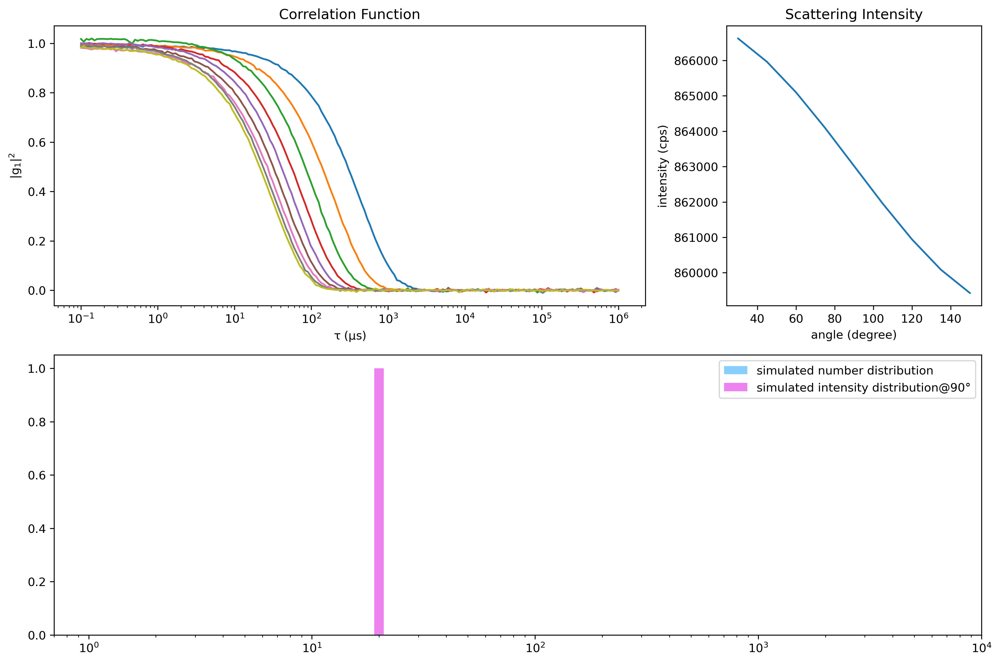

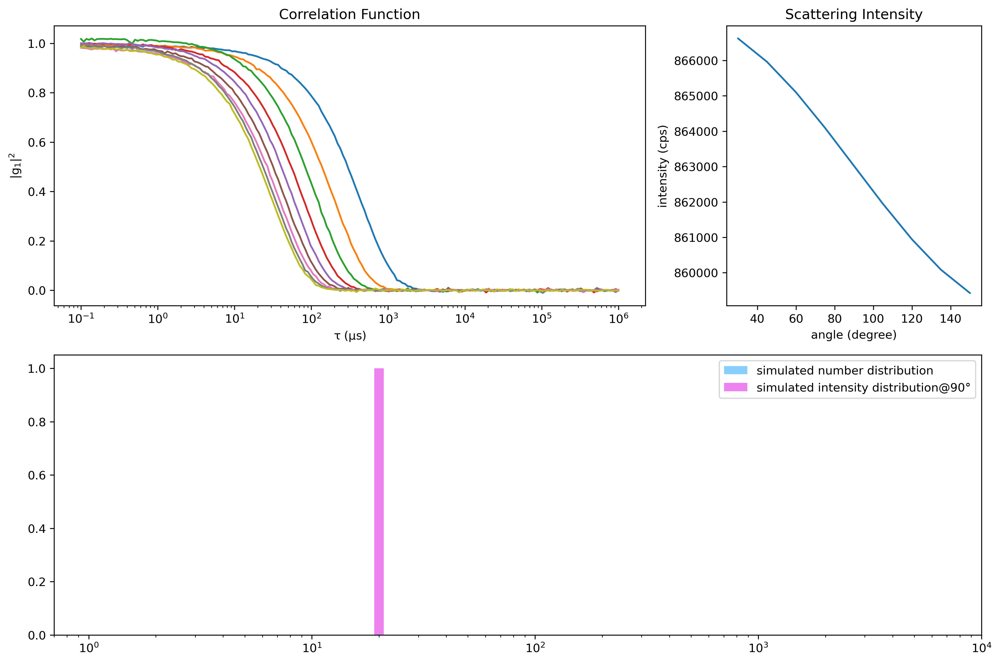

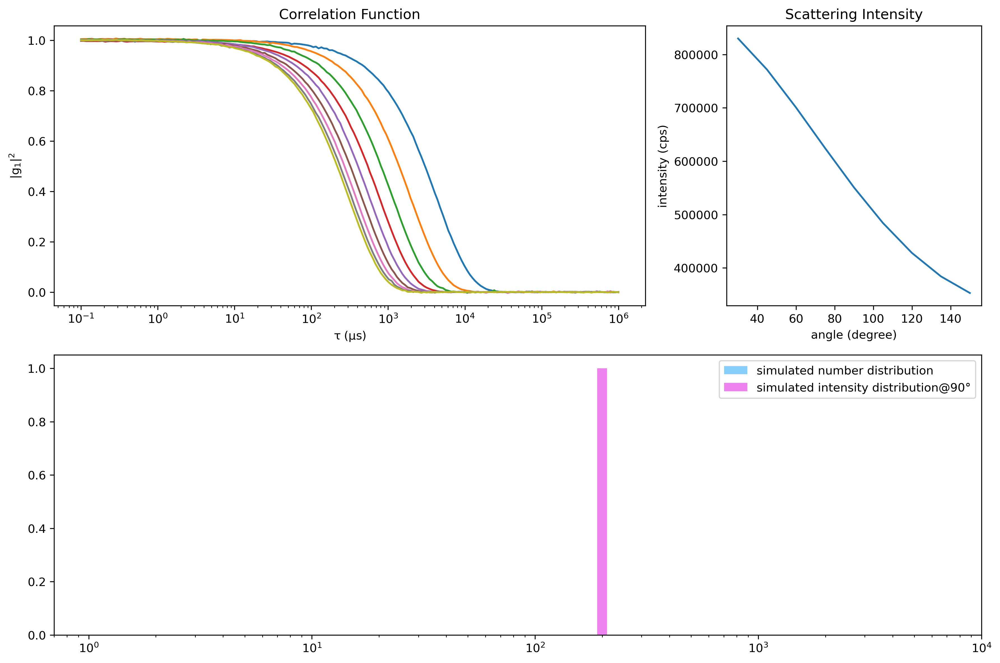

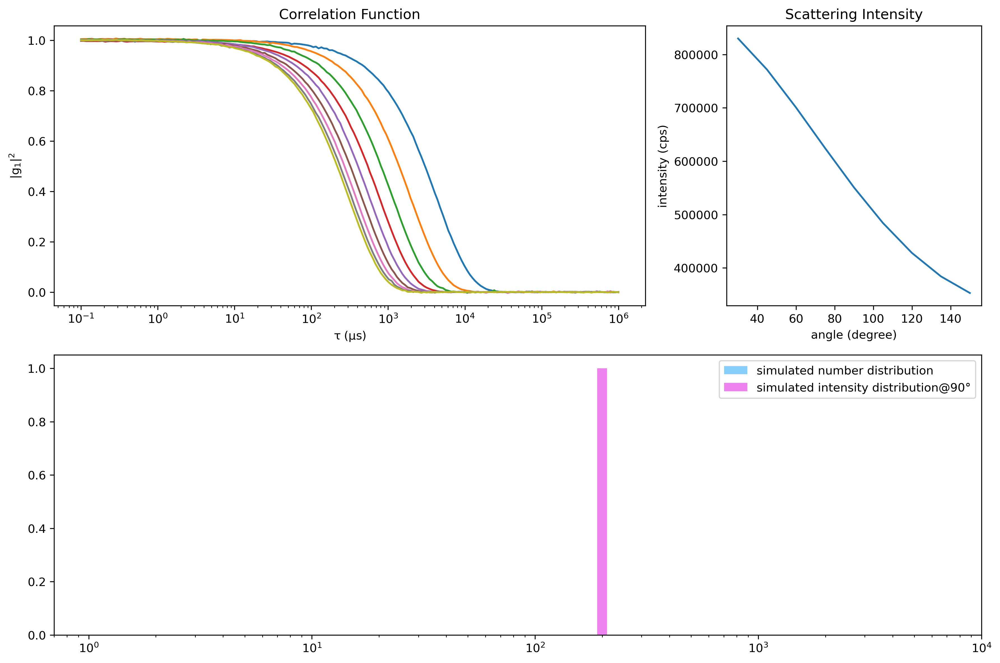

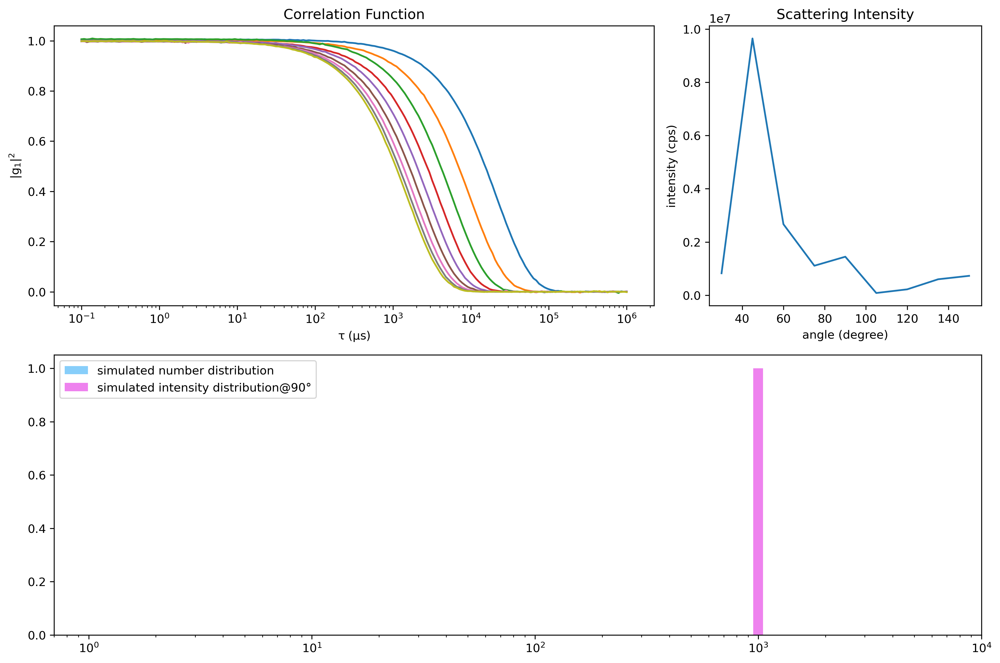

...

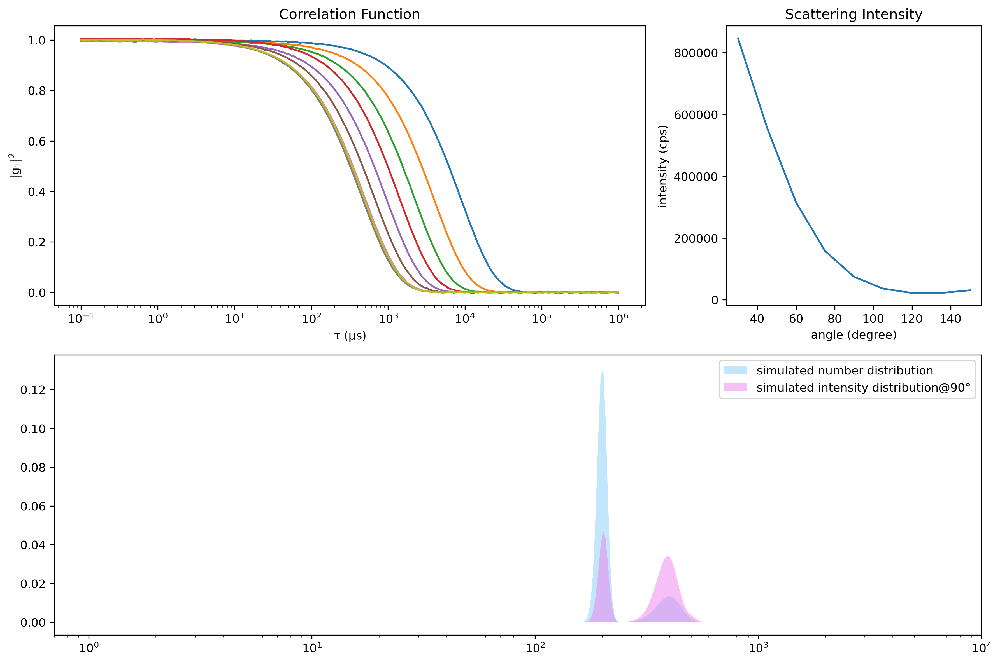

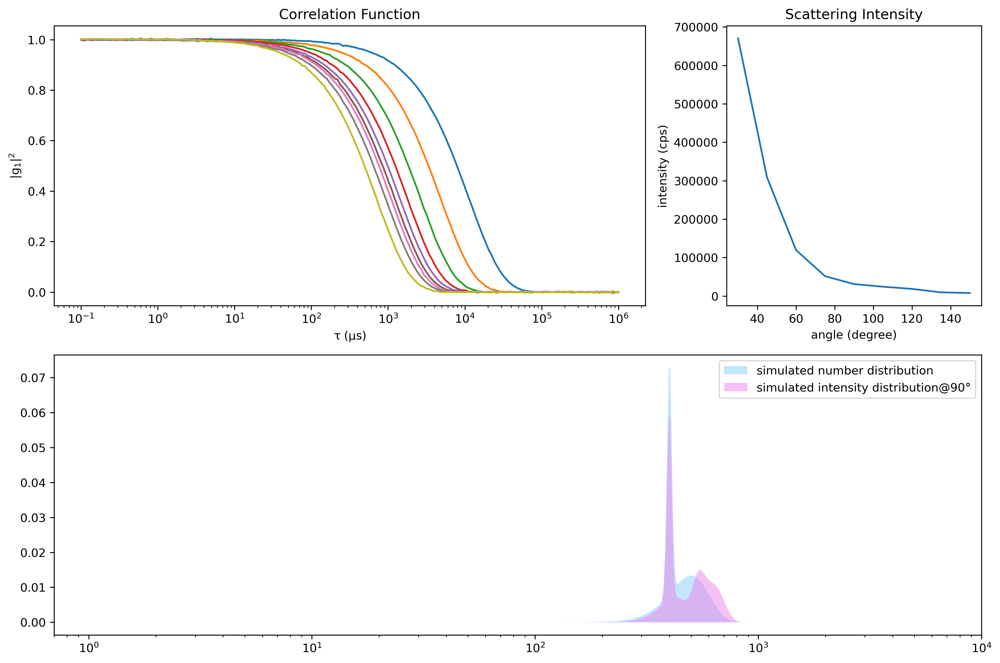

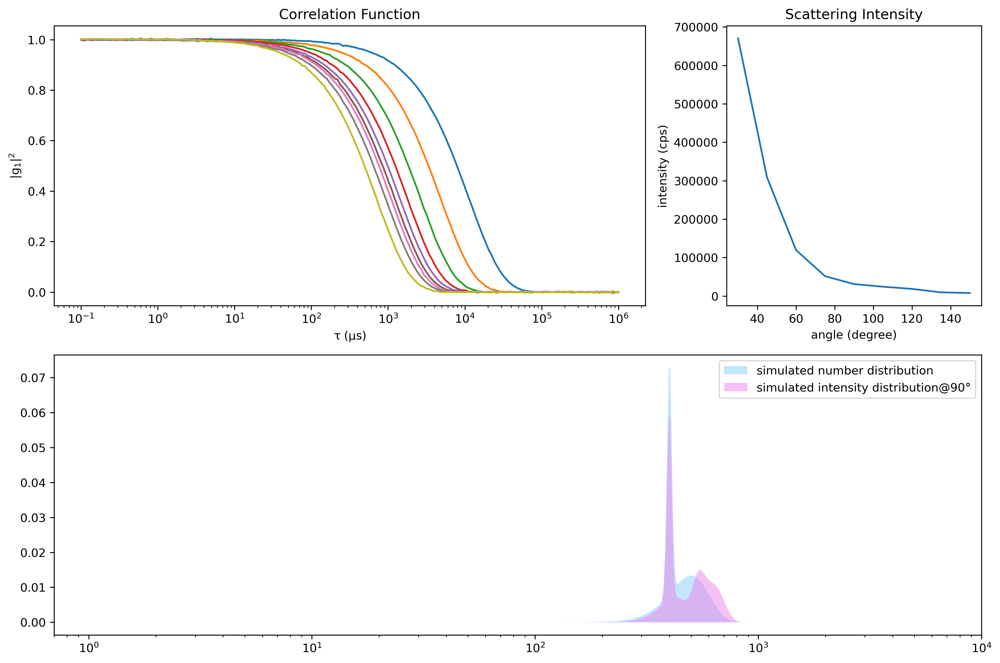

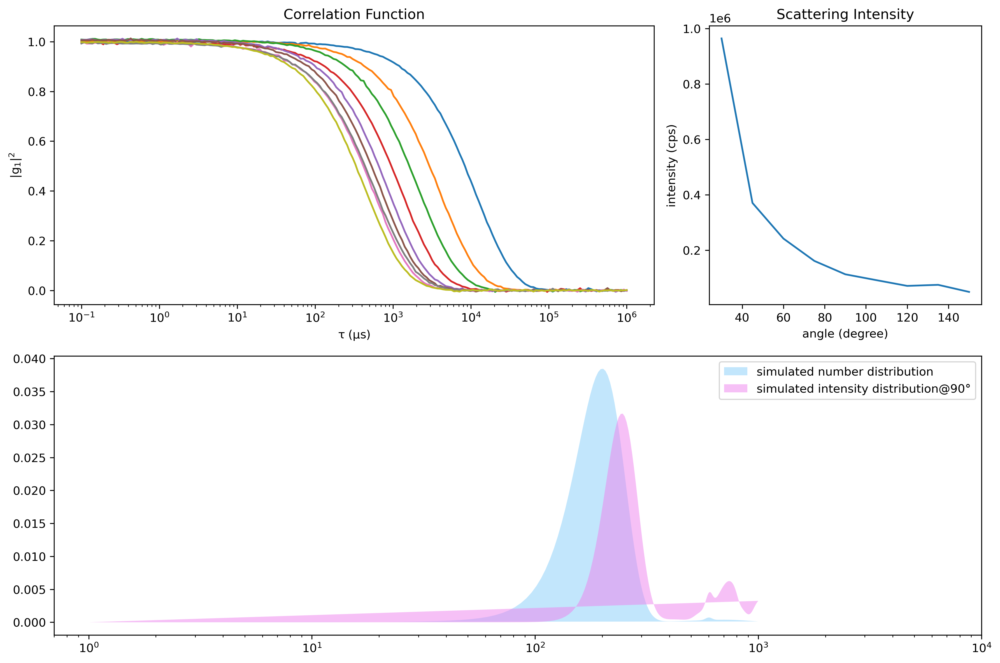

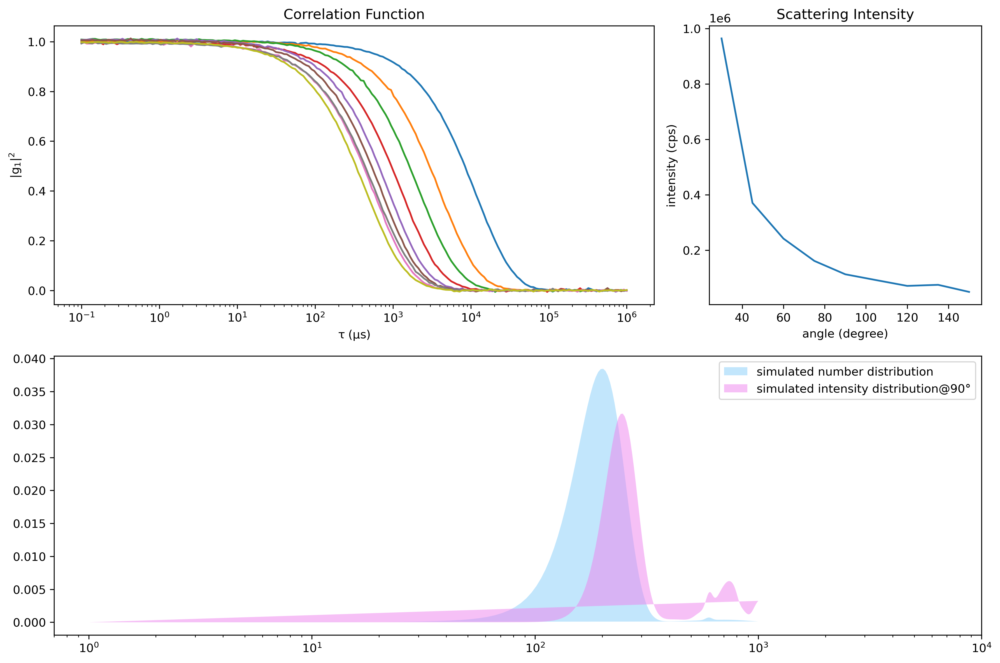

In [4]:
from PlotUtils import plotSimData
import json

tau = np.logspace(-1, 6, num=200)
angles = list(range(30, 151, 15))
params = Params()
for key, value in test_data.items():
    for index, sim_data in value.items():
        d, N = sim_data['d'], sim_data['N']
        if key != 'continuous':
            Nd_mode = 'discrete'
        else:
            Nd_mode = 'continuous'
        sim = DlsSimulator(d, N, Nd_mode, tau, params)
        mdlsdata = sim.simMdlsData(angles)
        name = 'data/simdata_{}_{}'.format(key, str(index))
        plotSimData(mdlsdata, filename='{}.png'.format(name))
        plotSimData(mdlsdata, filename='{}.svg'.format(name))
        with open('{}.json'.format(name), 'w') as f:
            json.dump(mdlsdata.toDict(), f, indent=4)

